In [1]:
import pandas as pd
import gzip

In [2]:
#!pip3 install simplejson
#pip install simplejson

In [3]:
import simplejson as json

In [4]:
def parse(path):
    g = gzip.open(path, 'rb')
    for l in g:
        yield json.loads(l)

def getDF(path):
    i = 0
    df = {}
    for d in parse(path):
        df[i] = d
        i += 1
    return pd.DataFrame.from_dict(df, orient='index')

core = getDF('Video_Games.json.gz')
#core=movies.columns = ['itemID', 'title']
meta = getDF('meta_Video_Games.json.gz')

In [5]:
#Creating own rating scheme from Video_Games data, with True value for the verified columns
rawrating=core[core.verified==True][['overall','reviewerID','asin']]
rawrating.columns = ['rating','userID', 'itemID']

#rating=pd.read_csv('Video_Games.csv',header=None)
#rating.columns = ['itemID', 'userID', 'rating', 'timestamp']

In [6]:
games=meta[meta.main_cat=='Video Games'][['asin','title']]
games.columns = ['itemID', 'title']

df = pd.merge(rawrating, games, on='itemID', how='inner')[['userID','title','rating']]
#Remove 0.9% rows of duplicates
df=df.drop_duplicates(keep='last')

In [7]:
df.isnull().sum()
#df does not have any missing information

userID    0
title     0
rating    0
dtype: int64

In [8]:
print('Dataset shape: {}'.format(df.shape))
print('-Dataset examples-')
print(df.iloc[::10000, :])

Dataset shape: (1521260, 3)
-Dataset examples-
                 userID                                              title  \
0        A21ROB4YDOZA5P  BRAND NEW Learning Company Oregon Trail 5th Ed...   
15567     AYPRCAREAN28M                      WarCraft 2 Battle.net Edition   
35591     A9UIJQQ4C1ADK                                        Ms. Pac-Man   
55611     A7Q7W0TW0TT2D                                        Banjo-Tooie   
75621     AOEWOUVC8JL3V                                Super Mario Advance   
...                 ...                                                ...   
1634559   AYRP4DI2UYDAB  eForCity&reg; 5 Pack Black Rechargeable 3600mA...   
1644753   A7EJUSP1PQ4MG  Gameboy Color Pokemon/pikachu Edition Blue Bat...   
1654839   A209DZPUI9FS3                         Saitek J22G P750 Pad (USB)   
1664899  A1LCOM8TMK1SC9        The Sims 4 Get Together :  [Instant Access]   
1674938  A3A663YR1FE9HV  Gam3Gear Wired Controller Gamepad for Original...   

         rating 

## Analyze the data

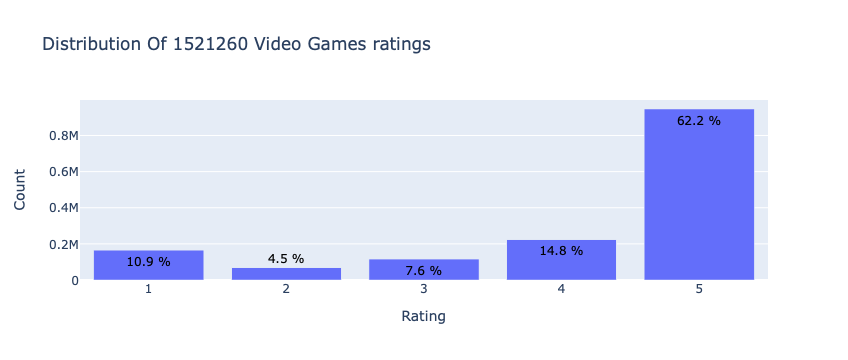

In [9]:
import plotly
from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

# Count the number of times each rating appears in the dataset
data = df['rating'].value_counts().sort_index(ascending=False)

# Create the histogram
trace = go.Bar(x = data.index,
               text = ['{:.1f} %'.format(val) for val in (data.values / df.shape[0] * 100)],
               textposition = 'auto',
               textfont = dict(color = '#000000'),
               y = data.values,
               )
# Create layout
layout = dict(title = 'Distribution Of {} Video Games ratings'.format(df.shape[0]),
              xaxis = dict(title = 'Rating'),
              yaxis = dict(title = 'Count'))
# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

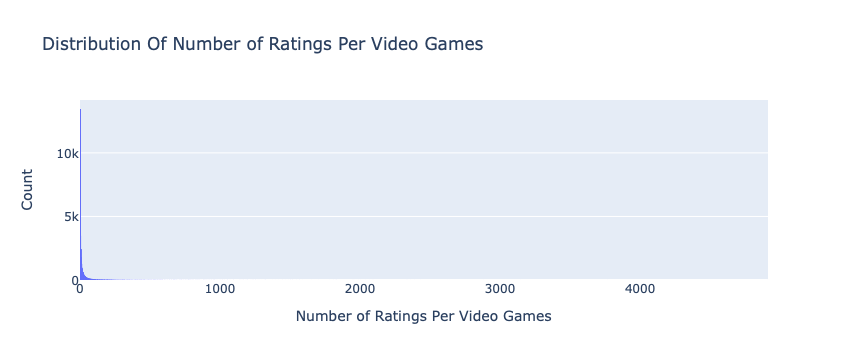

In [10]:
# Number of ratings per Video Games
data = df.groupby('title')['rating'].count()

# Create trace
trace = go.Histogram(x = data.values,
                     name = 'Ratings',
                     xbins = dict(start = 0,size = 2))
# Create layout
layout = go.Layout(title = 'Distribution Of Number of Ratings Per Video Games',
                   xaxis = dict(title = 'Number of Ratings Per Video Games'),
                   yaxis = dict(title = 'Count'),
                   bargap = 0.2)

# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

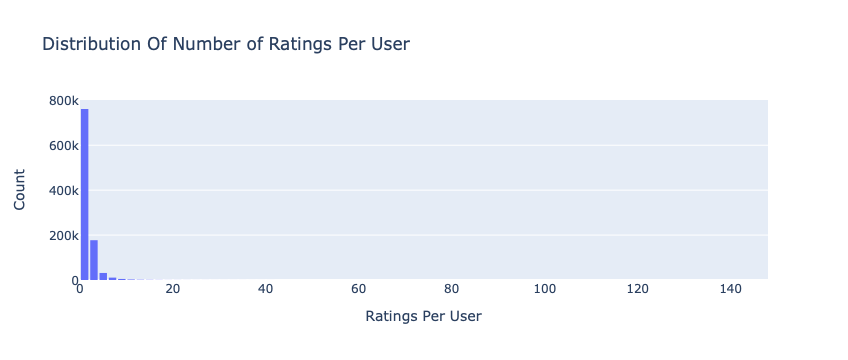

In [11]:
# Number of ratings per user
data = df.groupby('userID')['rating'].count()

# Create trace
trace = go.Histogram(x = data.values,
                     name = 'Ratings',
                     xbins = dict(start = 0, size = 2))
# Create layout
layout = go.Layout(title = 'Distribution Of Number of Ratings Per User',
                   xaxis = dict(title = 'Ratings Per User'),
                   yaxis = dict(title = 'Count'),
                   bargap = 0.2)

# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

In [12]:
#Stratified the dataset porportionally according to ratings
import numpy as np
N = 50000
sample=df.groupby('rating', group_keys=False).apply(lambda x: x.sample(int(np.rint(N*len(x)/len(df))))).sample(frac=1).reset_index(drop=True)

In [13]:
from surprise import Dataset
from surprise import Reader

reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(sample[['userID', 'title', 'rating']], reader=reader)
#data.split(n_folds=5)

## Benchmarking

In [17]:
from surprise import SVD,SVDpp
from surprise import Dataset,SVD,NormalPredictor
from surprise import BaselineOnly
from surprise import NMF
from surprise import SlopeOne
from surprise import CoClustering
from surprise import KNNBaseline
from surprise.model_selection import cross_validate
benchmark = []
# Iterate over all algorithms
for algorithm in [SVD(), SVDpp(), SlopeOne(), NMF(), NormalPredictor(), KNNBaseline(), BaselineOnly(), CoClustering()]:
    
    print("Testing {}".format(algorithm))
    # Perform cross validation
    results = cross_validate(algorithm, data, measures=['RMSE'], cv=3, verbose=False)
    
    # Get results & append algorithm name
    tmp = pd.DataFrame.from_dict(results).mean(axis=0)
    tmp = tmp.append(pd.Series([str(algorithm).split(' ')[0].split('.')[-1]], index=['Algorithm']))
    benchmark.append(tmp)
    
pd.DataFrame(benchmark).set_index('Algorithm').sort_values('test_rmse')    

Testing <surprise.prediction_algorithms.matrix_factorization.SVD object at 0x7ff055e43340>
Testing <surprise.prediction_algorithms.matrix_factorization.SVDpp object at 0x7ff055e43f40>
Testing <surprise.prediction_algorithms.slope_one.SlopeOne object at 0x7ff059a275b0>
Testing <surprise.prediction_algorithms.matrix_factorization.NMF object at 0x7ff059a27160>
Testing <surprise.prediction_algorithms.random_pred.NormalPredictor object at 0x7ff059a27070>
Testing <surprise.prediction_algorithms.knns.KNNBaseline object at 0x7ff059a27550>
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Testing <surprise.prediction_algorithms.baseline_only.BaselineOnly object at 0x7ff059a279d0>
Estimating biases using als...
Estimating biases using als

,test_rmse,fit_time,test_time
Algorithm,,,
KNNBaseline,1.325055,61.844700,0.488917
SVDpp,1.325075,3.587620,0.309528
SVD,1.325563,2.811034,0.125753
BaselineOnly,1.325716,0.316014,0.122601
SlopeOne,1.361157,6.854711,0.797671
CoClustering,1.361932,4.572562,0.100030
NMF,1.368844,6.233210,0.298813
NormalPredictor,1.731226,0.074275,0.151763


In [22]:
from surprise import SVD
from surprise import Dataset
from surprise.model_selection import cross_validate

# Use the famous SVD algorithm
algo = SVD()

# Run 5-fold cross-validation and then print results
cross_validate(algo, data, measures=['RMSE', 'MAE'], cv=3, verbose=True)


Evaluating RMSE, MAE of algorithm SVD on 3 split(s).

                  Fold 1  Fold 2  Fold 3  Mean    Std     
RMSE (testset)    1.3301  1.3217  1.3247  1.3255  0.0035  
MAE (testset)     1.0431  1.0382  1.0364  1.0392  0.0028  
Fit time          2.55    2.65    2.84    2.68    0.12    
Test time         0.11    0.11    0.12    0.11    0.01    


{'test_rmse': array([1.33006751, 1.32172916, 1.32470829]),
 'test_mae': array([1.04308988, 1.0382424 , 1.03641617]),
 'fit_time': (2.5545880794525146, 2.645186185836792, 2.844831943511963),
 'test_time': (0.10971856117248535, 0.10918188095092773, 0.12465214729309082)}

In [21]:
#Gridsearch for svd
from surprise import Dataset,SVD,NormalPredictor
from surprise.model_selection import GridSearchCV
param_grid = {'n_factors': [50,100,150,200],
              'n_epochs': [20,30,50], 
              'lr_all': [0.005,0.01],
              'reg_all':[0.02,0.1]}

gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3)
gs.fit(data)
params = gs.best_params['rmse']
svdtuned = SVD(n_factors=params['n_factors'], n_epochs=params['n_epochs'],lr_all=params['lr_all'], reg_all=params['reg_all'])


In [23]:
cross_validate(svdtuned, data, measures=['RMSE', 'MAE'], cv=3, verbose=True)

Evaluating RMSE, MAE of algorithm SVD on 3 split(s).

                  Fold 1  Fold 2  Fold 3  Mean    Std     
RMSE (testset)    1.3094  1.3249  1.3355  1.3233  0.0107  
MAE (testset)     1.0269  1.0358  1.0444  1.0357  0.0071  
Fit time          9.48    10.37   9.11    9.65    0.53    
Test time         0.15    0.11    0.11    0.12    0.02    


{'test_rmse': array([1.30938255, 1.32490819, 1.33552131]),
 'test_mae': array([1.02689622, 1.03580645, 1.04437865]),
 'fit_time': (9.475428104400635, 10.371556043624878, 9.109611988067627),
 'test_time': (0.15464401245117188, 0.10986089706420898, 0.11010217666625977)}

In [19]:
from surprise import KNNBaseline
from surprise.model_selection import cross_validate

# To use item-based cosine similarity
sim_options = {
    "name": "cosine",
    "user_based": False,  # Compute  similarities between items
}
knn = KNNBaseline(sim_options=sim_options)


results = cross_validate(knn, data, measures=['RMSE'], cv=3, verbose=True)

Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Evaluating RMSE of algorithm KNNBaseline on 3 split(s).

                  Fold 1  Fold 2  Fold 3  Mean    Std     
RMSE (testset)    1.3287  1.3235  1.3268  1.3263  0.0021  
Fit time          6.04    5.34    5.50    5.63    0.30    
Test time         0.21    0.13    0.12    0.15    0.04    


In [20]:
from surprise import KNNBaseline
from surprise.model_selection import GridSearchCV

sim_options = {
    "name": ["msd", "cosine"],
    "min_support": [3, 4, 5],
    "user_based": [False, True],
}

param_grid = {"sim_options": sim_options}

gs = GridSearchCV(KNNBaseline, param_grid, measures=["rmse", "mae"], cv=3)
gs.fit(data)

print(gs.best_score["rmse"])
print(gs.best_params["rmse"])

Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matr

In [25]:
# To use tuned 
sim_options = {'name': 'msd', 'min_support': 3, 'user_based': False}
knn_tuned = KNNBaseline(sim_options=sim_options)


## Interpretation

> One example of the video game and its neighbours
> A possible graph?

In [36]:
trainset = data.build_full_trainset()
knn_tuned.fit(trainset)

# Target movie to analyze its neighbourhood
video_game = 'Call of Duty: Ghosts Prestige Edition - Xbox One'

# Get the closes neighbourds
neighbors = knn_tuned.get_neighbors(knn_tuned.trainset.to_inner_iid(video_game), k=10)
# Translate the internal ids used in the algorithm to the movie names
neighbors = (knn_tuned.trainset.to_raw_iid(inner_id) for inner_id in neighbors)

print()
print('The 10 nearest neighbors of {} are:\n'.format(video_game))
for games in neighbors:
    print("\t",games)

Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.

The 10 nearest neighbors of Call of Duty: Ghosts Prestige Edition - Xbox One are:

	 Spore Hero - Nintendo Wii
	 Xbox One Media Remote
	 PlayStation 4 Black Friday Bundle - Grand Theft Auto V and The Last of Us Remastered
	 Skylanders Trap Team, Micro Comic Fun Packs, Jawbreaker with Exclusive Undead Trap
	 Xbox One Chat Headset
	 Dreamgear 3-Piece Stylus Pack for Nintendo 3DS
	 Ratchet &amp; Clank Collection
	 Just Dance 2014 - Nintendo Wii
	 Xbox 360 Universal Media Remote
	 Wii Fit U w/Fit Meter - Wii U


In [30]:
from sklearn.preprocessing import StandardScaler
x = StandardScaler().fit_transform(svdtuned.qi)

from sklearn.decomposition import PCA
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])

In [33]:
for row in principalDf.sort_values(by='principal component 1', ascending=False).head(10).iterrows():
    print("VideoGames: {} with PC value = {}".format(trainset.to_raw_iid(row[0]), row[1][0]))

VideoGames: Razer Carcharias Gaming Headset for Xbox 360/PC (Certified Refurbished) [Xbox 360] with PC value = 6.029328162993623
VideoGames: TNP Xbox One Cooling Fan - External USB Cooler Fan Stand with 2 Ports USB Hub for Xbox One Console (Black) [Xbox One] with PC value = 4.440501004005006
VideoGames: Monster Minis Extreme Off-Road Demo [Download] with PC value = 4.440206135866683
VideoGames: Playstation 3 Dual Wall Charger with PC value = 4.172125145625883
VideoGames: XBOX 360 Hardware Repair Kit 1 Complete Screw Washer Set for X-clamp Replacement with XBRdepot Stars 900 Thermal Compound &amp; Complimentary Deluxe Instructional e-Manual with PC value = 4.170486022908566
VideoGames: Yakuza 3 - Playstation 3 with PC value = 4.077510378035136
VideoGames: Hearts of Iron 3 Collection with PC value = 4.047789208269131
VideoGames: Merriam Webster's Spell-Jam [Download] with PC value = 3.8555280526321076
VideoGames: Call of Duty: Ghosts Prestige Edition - Xbox One with PC value = 3.65320280

In [34]:
for row in principalDf.sort_values(by='principal component 2', ascending=False).head(10).iterrows():
    print("VideoGames: {} with PC value = {}".format(trainset.to_raw_iid(row[0]), row[1][1]))

VideoGames: Call of Duty: Black Ops III - Digital Deluxe Edition - PlayStation 4 [Digital Code] with PC value = 4.749358403614307
VideoGames: Street Fighter Zero 2 [Japan Import] with PC value = 4.290625866573712
VideoGames: Mad Catz Major League Gaming - Arcade FightStick Tournament Edition with PC value = 4.021954363581379
VideoGames: Pandaren Soft Silicone Half Cover Skin with Hand Strap for PS4 /SLIM /PRO Controller Set(skin X 2 + Thumb Grip X 4)(black,white) with PC value = 4.015291894778419
VideoGames: Ci-Yu-Online VINYL SKIN [new 3DS XL] - Super Smash Bros. Red - Limited Edition STICKER DECAL COVER for NEW Nintendo 3DS XL / LL Console System with PC value = 3.9852709443075187
VideoGames: HDE Controller Extension Cable for Nintendo GameCube and Wii Consoles Two Pack Controller Extension Cable Cord for Gamepads and Controllers (2 Pack 6 ft) with PC value = 3.978732591686861
VideoGames: CTA Digital Wii Grand Slam Sports Pack (White) Sports Pack 6 in 1 for Wii with PC value = 3.7023

In [35]:
for row in principalDf.sort_values(by='principal component 3', ascending=False).head(10).iterrows():
    print("VideoGames: {} with PC value = {}".format(trainset.to_raw_iid(row[0]), row[1][2]))

VideoGames: Razer Carcharias Gaming Headset for Xbox 360/PC (Certified Refurbished) [Xbox 360] with PC value = 5.486901449953289
VideoGames: SeaWorld Adventure Parks Tycoon 3D with PC value = 4.183802864020344
VideoGames: Game Gear Powerback with PC value = 3.743352132101638
VideoGames: Tonsee 6 buttons Wireless Optical Silent Gaming Mouse For PC Laptop Gamer Red with PC value = 3.6887520716803603
VideoGames: PlayStation Portable Limited Edition Daxter Entertainment Pack - Ice Silver with PC value = 3.6853672441808607
VideoGames: Dotop XBOX Controller for Microsoft XBOX Black with PC value = 3.641212636324851
VideoGames: Zumba Fitness World Party - Nintendo Wii with PC value = 3.6363585023752276
VideoGames: CTA Digital Multi-Function Carrying Case for Xbox One XB1-MFC with PC value = 3.589360614955214
VideoGames: PlayStation Vita, WiFi Sapphire Blue, Japanese Version with PC value = 3.5737049854379057
VideoGames: The Voice Bundle with 2 Microphones - Xbox 360 with PC value = 3.54309283

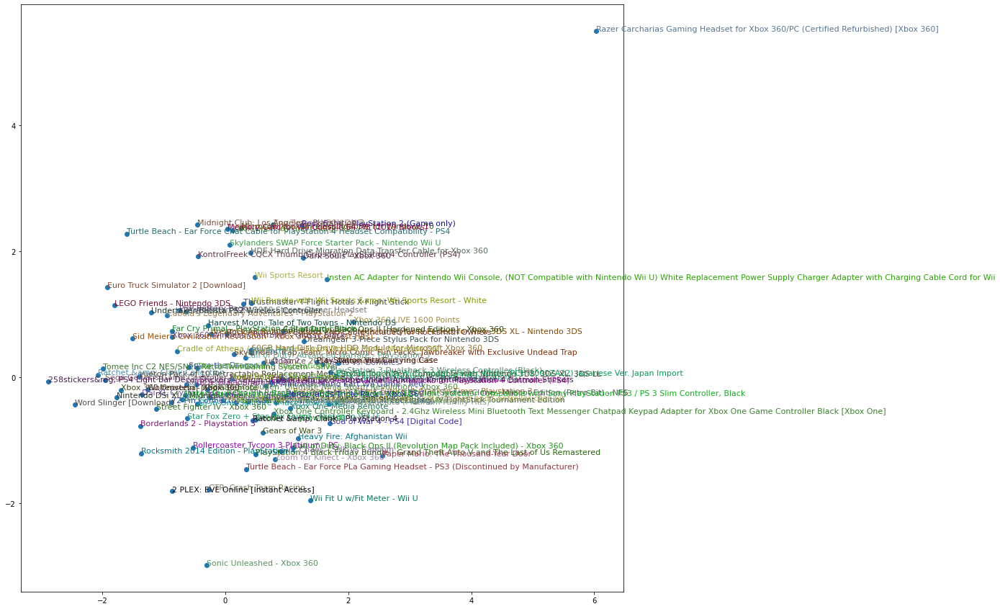

In [37]:
import matplotlib.pyplot as plt
import numpy as np

# Taking randomly just 100 movies to avoid overcrowding the plot
idxs = np.random.choice(len(principalDf), 100, replace=False) 
idxs = list(range(100))

# Represent the movies according to the principal components
X = principalDf.iloc[idxs]['principal component 1'].values
Y = principalDf.iloc[idxs]['principal component 3'].values

# Plot the movies
plt.figure(figsize=(15,15))
plt.scatter(X, Y)
for i, x, y in zip([trainset.to_raw_iid(idx) for idx in idxs], X, Y):
    plt.text(x,y,i, color=np.random.rand(3)*0.7, fontsize=11)
plt.show()

## Content-based

In [ ]:
ds=meta[meta.main_cat=='Video Games'][['asin','category']]
ds.columns = ['itemID', 'category']
ds['category'] = [''.join(map(str, x)) for x in ds['category']]

ds_sample=ds.sample(60000)

In [ ]:
ds_sample